In [37]:
%reset

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import r2_score, mean_squared_error, accuracy_score, precision_score, recall_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
import xgboost as xgb
from xgboost import XGBRegressor, XGBClassifier
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.model_selection import RepeatedKFold, KFold
from scipy.stats import pearsonr
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import RandomizedSearchCV
from hyperopt import hp
from hyperopt import fmin, tpe, Trials, STATUS_OK
from sklearn.preprocessing import PowerTransformer
from scipy.optimize import minimize, least_squares, brute
from scipy import optimize
from scipy.stats import boxcox
import pickle
from sklearn import decomposition
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from rdkit import Chem
from rdkit.Chem import Draw
import matplotlib.image as mpimg

In [2]:
# Rdkit 2048 (path length 7)
#df_2 = pd.read_csv('df_fin_2048.csv')
df_1 = pd.read_csv('df_fin_2048_short.csv')

In [93]:
# Morgan 2048 (radius 6)
df_1 = pd.read_csv('df_fin_morgan_2048_6_short.csv')

In [28]:
# PubChem 881
df_1 = pd.read_csv('df_fin_PubChem_short.csv')

In [40]:
# MACCS 166
#df_2 = pd.read_csv('df_fin_MACCS.csv')
df_1 = pd.read_csv('df_fin_MACCS_short.csv')

In [19]:
df_1

,Types of contaminants,pH,MB MWCO (Da),MB contact angle,removal rate (%),1,2,3,4,5,...,2039,2040,2041,2042,2043,2044,2045,2046,2047,2048
0,2(2butoxyethoxy)ethanol,7.0,150,50.0,81.5900,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,caprolactam,7.0,150,50.0,82.8500,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
2,creatine,7.0,150,50.0,96.6500,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
3,formaldehyde,7.0,150,50.0,3.3500,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,isopropanol,7.0,150,50.0,65.2700,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1782,indomethacin,7.0,200,22.6,97.0719,1,0,0,0,0,...,0,0,1,1,0,1,1,0,1,0
1783,cephalexinhydrate,7.0,200,22.6,95.2613,0,1,0,1,0,...,0,1,0,0,0,1,1,1,0,1
1784,diltiazem,7.0,200,22.6,98.3872,0,0,1,1,0,...,0,0,0,1,1,1,0,1,1,1
1785,erythromycin,7.0,200,22.6,94.7621,1,0,1,0,0,...,0,0,1,0,0,1,0,0,0,1


In [94]:
#df_2 = df_1.drop(labels=['Types of contaminants'], axis=1)
df_2 = df_1.drop(labels=['Types of contaminants', 'pH', 'MB MWCO (Da)', 'MB contact angle', 'removal rate (%)'], axis=1)

# PCA

In [66]:
pca = decomposition.PCA(n_components=2)
principalComponents = pca.fit_transform(df_2)

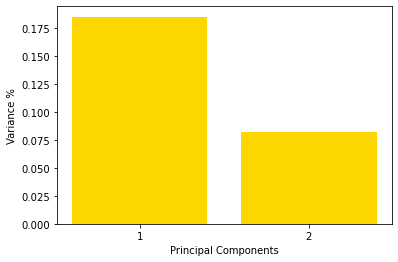

In [67]:
PC = range(1, pca.n_components_+1)
plt.bar(PC, pca.explained_variance_ratio_, color='gold')
plt.xlabel('Principal Components')
plt.ylabel('Variance %')
plt.xticks(PC)

# Putting components in a dataframe for later
PCA_components = pd.DataFrame(principalComponents)

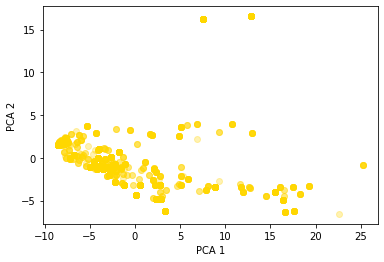

In [68]:
plt.scatter(PCA_components[0], PCA_components[1], alpha=.3, color='gold')
plt.xlabel('PCA 1')
plt.ylabel('PCA 2')
plt.show()

C:\Users\leesa\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1040: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=7.
  "KMeans is known to have a memory leak on Windows "


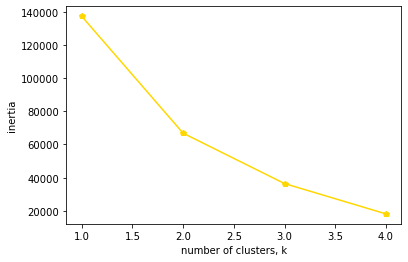

In [70]:
inertias = []
ks = 5

# Creating 10 K-Mean models while varying the number of clusters (k)
for k in range(1,ks):
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(PCA_components.iloc[:,:])
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(range(1,ks), inertias, '-p', color='gold')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.show()

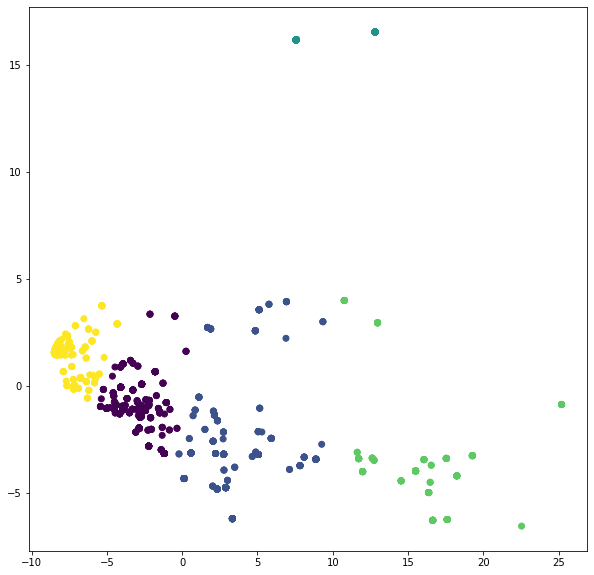

In [71]:
model = KMeans(n_clusters=5)
model.fit(PCA_components.iloc[:,:])

labels = model.predict(PCA_components.iloc[:,:])
plt.figure(figsize=(10,10))
plt.scatter(PCA_components[0], PCA_components[1], c=labels)
plt.show()

# t-SNE

In [95]:
tsne = TSNE(n_components=2, verbose=1, learning_rate='auto', n_iter=10000)
tsne_results = tsne.fit_transform(df_2)

C:\Users\leesa\AppData\Local\Continuum\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:783: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  FutureWarning,


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1787 samples in 0.000s...
[t-SNE] Computed neighbors for 1787 samples in 0.189s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1787
[t-SNE] Computed conditional probabilities for sample 1787 / 1787
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 61.915997
[t-SNE] KL divergence after 10000 iterations: -1.450715


In [96]:
df_subset = pd.DataFrame()
df_subset['tsne-2d-one'] = tsne_results[:,0]
df_subset['tsne-2d-two'] = tsne_results[:,1]
df_subset['rej'] = df_1['removal rate (%)']

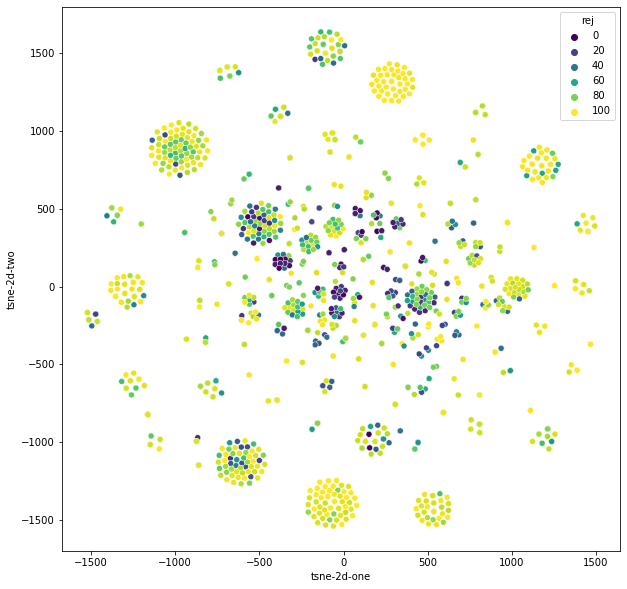

In [97]:
plt.figure(figsize=(10,10))
sns.scatterplot(
    x="tsne-2d-one", y="tsne-2d-two",
    hue='rej',
    palette='viridis',
    data=df_subset)
plt.show()

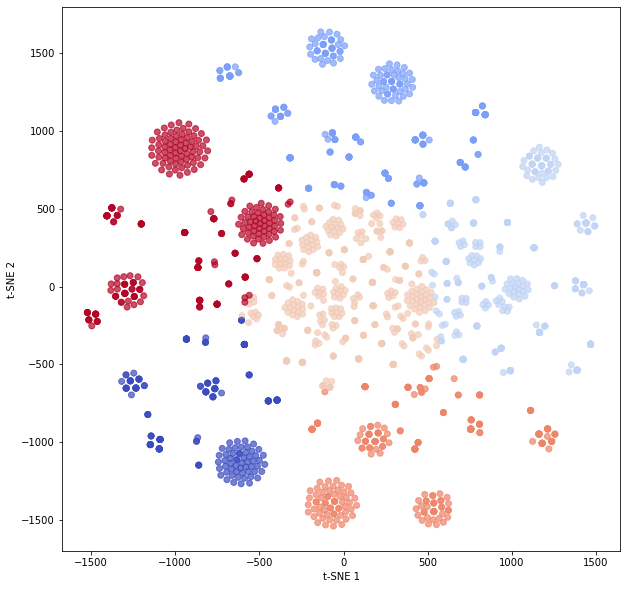

In [98]:
num_of_cluster = 6
model = KMeans(n_clusters=num_of_cluster) # 7 or 3(4)
model.fit(tsne_results[:,:])

labels = model.predict(tsne_results[:,:])
plt.figure(figsize=(10,10))
plt.scatter(df_subset['tsne-2d-one'], df_subset['tsne-2d-two'], c=labels, alpha=0.7, cmap='coolwarm')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')
plt.show()

In [99]:
df_labels = pd.DataFrame(labels)
df_labels.columns = ['cluster_label']

In [100]:
#df_2 = df_1.drop(labels=['Types of contaminants'], axis=1)
df_2 = pd.concat([df_1['removal rate (%)'], df_2], axis=1)
df_2 = pd.concat([df_1['Types of contaminants'], df_2], axis=1)
df_2 = pd.concat([df_labels, df_2], axis=1)

In [101]:
df_rej = pd.read_csv('compound_rejections.csv')

df_rej['Types of contaminants'] = df_rej['Types of contaminants'].str.lower()
df_rej['Types of contaminants'] = df_rej['Types of contaminants'].str.replace(' ', '')
df_rej['Types of contaminants'] = df_rej['Types of contaminants'].str.replace('-', '')

In [102]:
df_rej.drop(labels=['ID', 'Type of MB', 'Compound abbreviation', 'pH', 'MB MWCO (Da)', 'MB contact angle', 'removal rate (%)', 
                    'Measurement time (min)', 'Pressure (kPa)', 'Initial concentration of compound (mg/L)', 'MB zeta potential',
                    'compound size (nm)', 'Total charge', 'reference', 'MWCO ref', 'MB contact angle ref', 'MB zeta potential ref'], axis=1, inplace=True)
# 'Compound Mw (g/mol)', 'Compound charge', 'Compound Kow', 'min projection (A)', 'max projection (A)'

In [103]:
df_mol_prop = pd.read_csv('new_list_2.csv')

In [104]:
df_mol_prop_2 = pd.DataFrame([df_rej['Types of contaminants'], df_rej['Compound Mw (g/mol)'], df_rej['Compound charge'], df_rej['Compound Kow'], df_rej['min projection (A)'], df_rej['max projection (A)']])
df_mol_prop_2 = df_mol_prop_2.T

In [105]:
df_fin = pd.DataFrame()

for i in range(len(df_mol_prop)):
    c = df_mol_prop['compound'].iloc[i]
    for j in range(len(df_mol_prop_2)):
        if c == df_mol_prop_2['Types of contaminants'].iloc[j]:
            result = pd.concat([df_mol_prop.iloc[i, 1:], df_mol_prop_2.iloc[j, 1:]], axis=0)
            df_result = pd.DataFrame(result)
            transposed = df_result.T
            df_fin = pd.concat([df_fin, transposed], axis = 0)

df_fin.reset_index(drop=True, inplace=True)

In [106]:
df_fin.to_csv('df_mol_prop_final_morgan.csv')

In [107]:
df_fin_2 = pd.read_csv('df_mol_prop_final_sorted_morgan.csv')

In [108]:
df_temp = np.zeros((1787, 2057))
df_temp = pd.DataFrame(df_temp)

for i in range(len(df_fin_2)):
    c = df_fin_2['compound'].iloc[i]
    for j in range(len(df_2)):
        if c == df_2['Types of contaminants'].iloc[j]:
            result = pd.concat([df_fin_2.iloc[i, 1:], df_2.iloc[j]], axis=0)
            df_result = pd.DataFrame(result)
            transposed = df_result.T
            df_temp.iloc[j] = transposed.iloc[0]

df_temp.reset_index(drop=True, inplace=True)
df_temp.columns = transposed.columns

In [109]:
df_temp.to_csv('df_mol_prop_final_final_morgan.csv')

In [110]:
df_temp = pd.read_csv('df_mol_prop_final_final_morgan.csv')

In [111]:
df_temp['cluster_label'] = df_labels

In [112]:
for i in range(num_of_cluster):
    df_temp_2 = pd.DataFrame()
    label = i
    for j in range(len(df_temp)):
        if label == df_temp['cluster_label'].iloc[j]:
            df_temp_2 = pd.concat([df_temp_2, df_temp.iloc[j]], axis=1)
    df_temp_2 = pd.DataFrame(df_temp_2)
    df_temp_2 = df_temp_2.T        
    
    print('mean', np.mean(df_temp_2.iloc[:, 1:10]))
    print('std', np.std(df_temp_2.iloc[:, 1:10]))

C:\Users\leesa\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3438: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
C:\Users\leesa\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3579: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


mean Compound Mw (g/mol)    231.760426
Compound charge         -0.186008
Compound Kow             0.174465
min projection (A)       4.568168
max projection (A)       6.209851
cluster_label            0.000000
removal rate (%)        77.099799
dtype: float64
std Compound Mw (g/mol)    48.803792
Compound charge         0.532100
Compound Kow            1.137822
min projection (A)      0.727237
max projection (A)      1.269885
cluster_label           0.000000
removal rate (%)       26.051767
dtype: float64
mean Compound Mw (g/mol)    301.114193
Compound charge         -0.160117
Compound Kow             2.102625
min projection (A)       4.544324
max projection (A)       6.857838
cluster_label            1.000000
removal rate (%)        82.408208
dtype: float64
std Compound Mw (g/mol)    93.614928
Compound charge         0.609394
Compound Kow            1.813607
min projection (A)      0.514403
max projection (A)      1.493420
cluster_label           0.000000
removal rate (%)       21.934251

<AxesSubplot:xlabel='cluster_label', ylabel='removal rate (%)'>

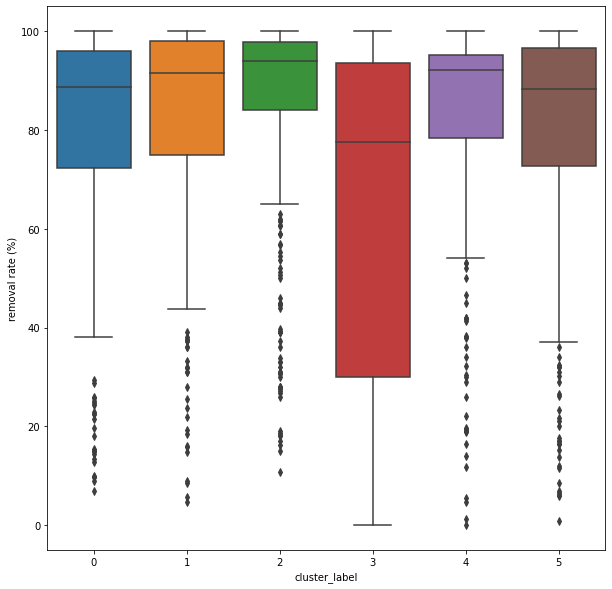

In [113]:
plt.figure(figsize=(10,10))
sns.boxplot(x=df_temp['cluster_label'], y=df_temp['removal rate (%)'])#, hue=df_temp['Compound Mw (g/mol)'])

In [114]:
df_lab = pd.read_csv('cluster_label_3_morgan.csv')

In [115]:
df_lab_sorted = df_lab[df_lab['removal rate (%)'] <= 63]

In [116]:
df_lab_sorted

,SMILES,Compound Mw (g/mol),Compound charge,Compound Kow,min projection (A),max projection (A),cluster_label,Types of contaminants,removal rate (%)
1,C=O,30.026,0.0000,-0.467,2.08,2.34,3,formaldehyde,3.35
3,CO,32.042,0.0000,-0.519,2.20,2.62,3,methanol,3.77
4,NC(N)=O,60.056,0.0000,-1.364,2.87,3.19,3,urea,17.16
7,CN(C)N=O,74.083,0.0083,0.039,3.00,3.49,3,nnitrosodimethylamine,60.51
12,CCO,46.069,0.0000,-0.162,2.56,3.23,3,ethylalcohol,33.79
...,...,...,...,...,...,...,...,...,...
323,C(=C(Cl)Cl)(Cl)Cl,165.820,0.0000,2.615,3.18,3.86,3,perchloroethylene,39.00
324,CCO,46.069,0.0000,-0.162,2.39,3.23,3,ethanol,8.70
336,ClC=C(Cl)Cl,131.380,0.0000,2.178,3.13,3.85,3,trichloroethylene,33.00
337,C(Cl)(Cl)(Cl)Cl,153.810,0.0000,2.997,3.16,3.18,3,carbontetrachloride,52.00


In [119]:
# https://stackoverflow.com/questions/16183462/saving-images-in-python-at-a-very-high-quality

fig = plt.figure(figsize=(40,40), dpi=1200)

for i in range(len(df_lab_sorted)):
    m = Chem.MolFromSmiles(df_lab_sorted['SMILES'].iloc[i])
    Draw.MolToFile(m,'mol.png', size=(600, 600))
#     Draw.MolToFile(m, 'mol.svg', size=(600, 600))
#     cairosvg.svg2png(url='mol.svg', write_to='mo.png')
#     img = Image.open('mol.svg')
    img = mpimg.imread('mol.png')
    #print(img)
    ax = fig.add_subplot(16,10,i+1)
    ax.imshow(img)
    ax.set_title([df_lab_sorted['Types of contaminants'].iloc[i], df_lab_sorted['removal rate (%)'].iloc[i]])
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)  
plt.show()

fig.savefig("report_lab_sorted.pdf", bbox_inches='tight', transparent=True)#, dpi='figure')